In [2]:
import os
import json
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm
from scipy.stats import binned_statistic_2d
import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib.patches import RegularPolygon, Arrow, ArrowStyle,FancyArrowPatch, Circle,FancyArrow
from mplsoccer.pitch import Pitch, VerticalPitch
from matplotlib.colors import Normalize
from matplotlib import cm
from highlight_text import fig_text, ax_text

import warnings
warnings.filterwarnings("ignore")


In [3]:
path1 = '/Users/junseopark/Desktop/학부연구생 python/Man_City_1_1_Chelsea_17022024_opta_events_processed.csv'
path2 = '/Users/junseopark/Desktop/학부연구생 python/1729486_Man_City_1_1_Chelsea.json'

In [4]:
events_df = pd.read_csv(path1)

print(events_df.shape)

events_df.head()

(1716, 260)


,id,eventId,minute,second,teamId,h_a,x,y,expandedMinute,period,...,penaltyShootoutConcededGK,throwIn,subOn,subOff,defensiveThird,midThird,finalThird,pos,teamName,xT_added
0,2.647549e+09,2,0,0.0,15,a,0.0,0.0,0,FirstHalf,...,False,False,False,False,False,False,False,False,Chelsea,0.000000
1,2.647549e+09,2,0,0.0,167,h,0.0,0.0,0,FirstHalf,...,False,False,False,False,False,False,False,False,Man City,0.000000
2,2.647549e+09,3,0,0.0,15,a,50.1,50.0,0,FirstHalf,...,False,False,False,False,True,False,False,True,Chelsea,0.000000
3,2.647549e+09,4,0,2.0,15,a,30.8,54.2,0,FirstHalf,...,False,False,False,False,False,False,True,True,Chelsea,0.017476
4,2.647549e+09,5,0,5.0,15,a,67.1,19.8,0,FirstHalf,...,False,False,False,False,False,True,False,True,Chelsea,0.000000


In [5]:
events_df[events_df['type'] == 'pass'].groupby(['teamName']).agg({'id':'nunique'})

,id
teamName,


In [6]:
with open(path2, 'r') as f :
    match_data = json.load(f)

In [7]:
match_data.keys()

dict_keys(['attendance', 'away', 'commonEvents', 'competitionStage', 'competitionType', 'elapsed', 'etScore', 'events', 'expandedMaxMinute', 'expandedMinutes', 'formationIdNameMappings', 'ftScore', 'home', 'htScore', 'league', 'matchCentreEventTypeJson', 'matchId', 'maxMinute', 'maxPeriod', 'minuteExpanded', 'periodCode', 'periodEndMinutes', 'periodMinuteLimits', 'pkScore', 'playerIdNameDictionary', 'referee', 'region', 'score', 'season', 'startDate', 'startTime', 'statusCode', 'timeStamp', 'timeoutInSeconds', 'venueName', 'weatherCode'])

In [8]:
res_dict = {}

teamIds = events_df['teamId'].unique()

for teamId in teamIds:
    
    mask = events_df['teamId'] == teamId
    df_ = events_df[mask]
    
    teamName = df_['teamName'].unique()[0]
        
    venue = 'home' if df_[df_['teamId'] == teamId]['h_a'].unique()[0] == 'h' else 'away'

    mask1 = df_['cardType'].apply(lambda x: x in ["SecondYellow", "Red"])
    first_red_card_minute = df_[mask1].minute.min()

    mask2 = events_df['type'] == 'SubstitutionOn'
    first_sub_min = events_df[mask2].minute.min()

    max_minute = df_.minute.max()

    num_minutes = min(first_sub_min, first_red_card_minute, max_minute)
      
    passes_df = df_.reset_index().drop('index', axis=1)
    passes_df['playerId'] = passes_df['playerId'].astype('Int64')
    passes_df = passes_df[passes_df['playerId'].notnull()]
    passes_df['passRecipientName'] = passes_df['playerName'].shift(-1)
    passes_df = passes_df[passes_df['passRecipientName'].notnull()]
    
    mask1 = passes_df['type'].apply(lambda x: x in ['Pass'])
    passes_df_all = passes_df[mask1]
    
    mask2 = passes_df_all['minute'] < num_minutes
    players = passes_df_all[passes_df_all['minute'] < num_minutes]['playerName'].unique()
    mask3 = passes_df_all['playerName'].apply(lambda x: x in players)
    passes_df_short = passes_df_all[mask2 & mask3]
    
    
    mask2 = passes_df_all['playerName'] != passes_df_all['passRecipientName']
    mask3 = passes_df_all['outcomeType'] == 'Successful'
    passes_df_suc = passes_df_all[mask2&mask3]
    

    mask2 = passes_df_suc['minute'] < num_minutes
    players = passes_df_suc[passes_df_suc['minute'] < num_minutes]['playerName'].unique()
    mask3 = passes_df_suc['playerName'].apply(lambda x: x in players) & \
            passes_df_suc['passRecipientName'].apply(lambda x: x in players)
    passes_df_suc_short = passes_df_suc[mask2 & mask3]
    
    print('team: ',teamName)
    print('passes: ', passes_df_all.shape[0])
    print('suc passes: ', passes_df_suc.shape[0])
    print('last minute: min(first red / substitution / end game) = ', num_minutes)
    
    print('suc passes befor last minute: ', passes_df_short.shape[0])
    print('\n')
    
    res_dict[teamId] = {}
    
    res_dict[teamId]['passes_df_all'] = passes_df_all
    res_dict[teamId]['passes_df_short'] = passes_df_short
    res_dict[teamId]['passes_df_suc'] = passes_df_suc
    res_dict[teamId]['passes_df_suc_short'] = passes_df_suc_short
    res_dict[teamId]['minutes'] = num_minutes

team:  Chelsea
passes:  331
suc passes:  264
last minute: min(first red / substitution / end game) =  63
suc passes befor last minute:  257


team:  Man City
passes:  783
suc passes:  688
last minute: min(first red / substitution / end game) =  63
suc passes befor last minute:  510




In [9]:
teamIds

array([ 15, 167])

In [10]:
var = 'playerName'
var2 = 'passRecipientName'

for teamId in teamIds:

    passes_df_all = res_dict[teamId]['passes_df_all']
    passes_df_suc = res_dict[teamId]['passes_df_suc']
    passes_df_short = res_dict[teamId]['passes_df_short']
    passes_df_suc_short = res_dict[teamId]['passes_df_suc_short']
    
    player_position = passes_df_short.groupby(var).agg({'x': ['median'], 'y': ['median']})

    player_position.columns = ['x', 'y']
    player_position.index.name = 'playerName'
    player_position.index = player_position.index.astype(str)

    player_pass_count_all = passes_df_all.groupby(var).agg({'playerId':'count'}).rename(columns={'playerId':'num_passes_all'})
    player_pass_count_suc = passes_df_suc.groupby(var).agg({'playerId':'count'}).rename(columns={'playerId':'num_passes'})
    player_pass_count_suc_short = passes_df_suc_short.groupby(var).agg({'playerId':'count'}).rename(columns={'playerId':'num_passes2'})
    player_pass_count = player_pass_count_all.join(player_pass_count_suc).join(player_pass_count_suc_short)
    
        
    passes_df_all["pair_key"] = passes_df_all.apply(lambda x: "_".join([str(x[var]), str(x[var2])]), axis=1)
    passes_df_suc["pair_key"] = passes_df_suc.apply(lambda x: "_".join([str(x[var]), str(x[var2])]), axis=1)
    passes_df_suc_short["pair_key"] = passes_df_suc_short.apply(lambda x: "_".join([str(x[var]), str(x[var2])]), axis=1)


    
    pair_pass_count_all = passes_df_all.groupby('pair_key').agg({'playerId':'count'}).rename(columns={'playerId':'num_passes_all'})
    pair_pass_count_suc = passes_df_suc.groupby('pair_key').agg({'playerId':'count'}).rename(columns={'playerId':'num_passes'})
    pair_pass_count_suc_short = passes_df_suc_short.groupby('pair_key').agg({'playerId':'count'}).rename(columns={'playerId':'num_passes2'})
    pair_pass_count = pair_pass_count_all.join(pair_pass_count_suc).join(pair_pass_count_suc_short)
    
    
    
    player_pass_value_suc = (passes_df_suc.groupby(var)
                                 .agg({'xT_added':'sum'})
                                 .round(3)
                                 .rename(columns={'xT_added':'pass_value'}))
    player_pass_value_suc_short = (passes_df_suc_short.groupby(var)
                                 .agg({'xT_added':'sum'})
                                 .round(3)
                                 .rename(columns={'xT_added':'pass_value2'}))
    player_pass_value = player_pass_value_suc.join(player_pass_value_suc_short)

    
    
                
    pair_pass_value_suc = (passes_df_suc.groupby(['pair_key'])
                               .agg({'xT_added':'sum'})
                               .round(3)
                               .rename(columns={'xT_added':'pass_value'}))
    pair_pass_value_suc_short = (passes_df_suc_short.groupby(['pair_key'])
                           .agg({'xT_added':'sum'})
                           .round(3)
                           .rename(columns={'xT_added':'pass_value2'}))
    pair_pass_value = pair_pass_value_suc.join(pair_pass_value_suc_short)

    
    player_position['z'] = player_position['x']
    player_position['x'] = player_position['y']
    player_position['y'] = player_position['z']
    
    res_dict[teamId]['player_position'] = player_position
    res_dict[teamId]['player_pass_count'] = player_pass_count
    res_dict[teamId]['pair_pass_count'] = pair_pass_count
    res_dict[teamId]['player_pass_value'] = player_pass_value
    res_dict[teamId]['pair_pass_value'] = pair_pass_value

In [11]:
res_dict[15].keys()

dict_keys(['passes_df_all', 'passes_df_short', 'passes_df_suc', 'passes_df_suc_short', 'minutes', 'player_position', 'player_pass_count', 'pair_pass_count', 'player_pass_value', 'pair_pass_value'])

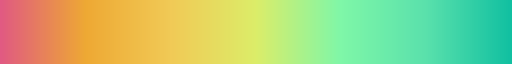

In [12]:
nodes_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ['#E15A82',
                                                               '#EEA934',
                                                               '#F1CA56',
                                                               '#DCED69',
                                                               '#7FF7A8',
                                                               '#5AE1AC',
                                                               '#11C0A1'
                                                               
                                                                       
                                                            ])
nodes_cmap

In [13]:
node_cmap = cm.get_cmap(nodes_cmap)

norm = Normalize(vmin=0, vmax=1)
node_color1 = node_cmap(norm(0)) 
node_color2 = node_cmap(norm(0.25)) 
node_color3 = node_cmap(norm(0.5)) 
node_color4 = node_cmap(norm(0.75)) 
node_color5 = node_cmap(norm(1)) 

In [14]:
def change_range(value, old_range, new_range):

    new_value = ((value-old_range[0]) / (old_range[1]-old_range[0])) * (new_range[1]-new_range[0]) + new_range[0]
    
    if new_value >= new_range[1]:
        return new_range[1]
    elif new_value <= new_range[0]:
        return new_range[0]
    else:
        return new_value

In [15]:
min_node_size = 5
max_node_size = 35

max_player_count = 88
min_player_count = 1

max_player_value = 0.36
min_player_value = 0.01

#font
font_size = 8
font_color = 'black'

#edges arrow

min_edge_width = 0.5
max_edge_width = 5

head_length = 0.3
head_width = 0.1

max_pair_count = 16
min_pair_count = 1

min_pair_value  = 0.01
max_pair_value = 0.085

min_passes = 5

In [16]:
#plotting pitches and prepare data

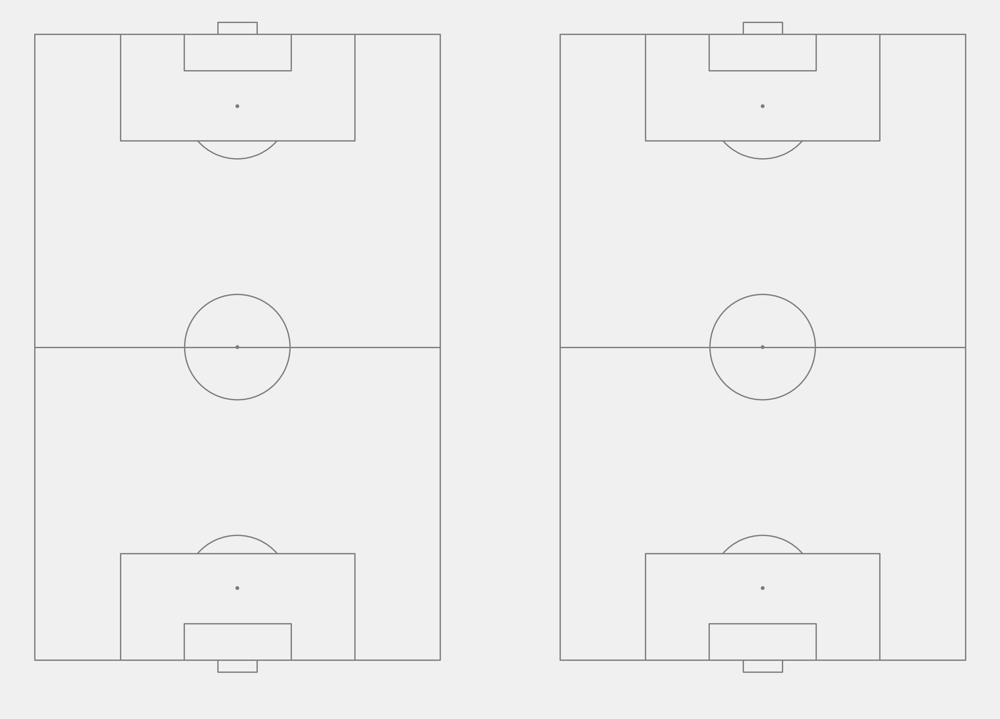

In [17]:
plt.style.use('fivethirtyeight')

fig,ax = plt.subplots(1,2,figsize=(6,6), dpi=400)

teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

for i, teamid in enumerate([teamId_home, teamId_away]):    

    #define dataframes
    position = res_dict[teamid]['player_position']
    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']
    player_pass_value = res_dict[teamid]['player_pass_value']
    pair_pass_value = res_dict[teamid]['pair_pass_value']
    minutes_ = res_dict[teamid]['minutes']

    pitch = VerticalPitch(pitch_type='opta', 
                          line_color='#7c7c7c',
                          goal_type='box',
                          linewidth=0.5,
                        pad_bottom=10)
    
    #plot vertical pitches
    pitch.draw(ax=ax[i], constrained_layout=False, tight_layout=False)
    
    # Step 1: processing for plotting edges
    pair_stats = pd.merge(pair_pass_count, pair_pass_value, left_index=True, right_index=True)
    pair_stats = pair_stats.sort_values('num_passes',ascending=False)
    pair_stats2 = pair_stats[pair_stats['num_passes'] >= min_passes]
    
    # Step 2: processing for plotting nodes
    player_stats = pd.merge(player_pass_count, player_pass_value, left_index=True, right_index=True)
    
    #FILTER first 11 players
    mask = events_df['minute'] < minutes_
    players_ = list(set(events_df[mask]['playerName'].dropna()))
    
    mask_ = player_stats.index.map(lambda x: x in players_)
    player_stats = player_stats.loc[mask_]
    
    mask_ = pair_stats2.index.map(lambda x: (x.split('_')[0] in players_) &  (x.split('_')[1] in players_))
    pair_stats2 = pair_stats2[mask_]
    
    ind = position.index.map(lambda x: x in players_)
    position = position.loc[ind]
    

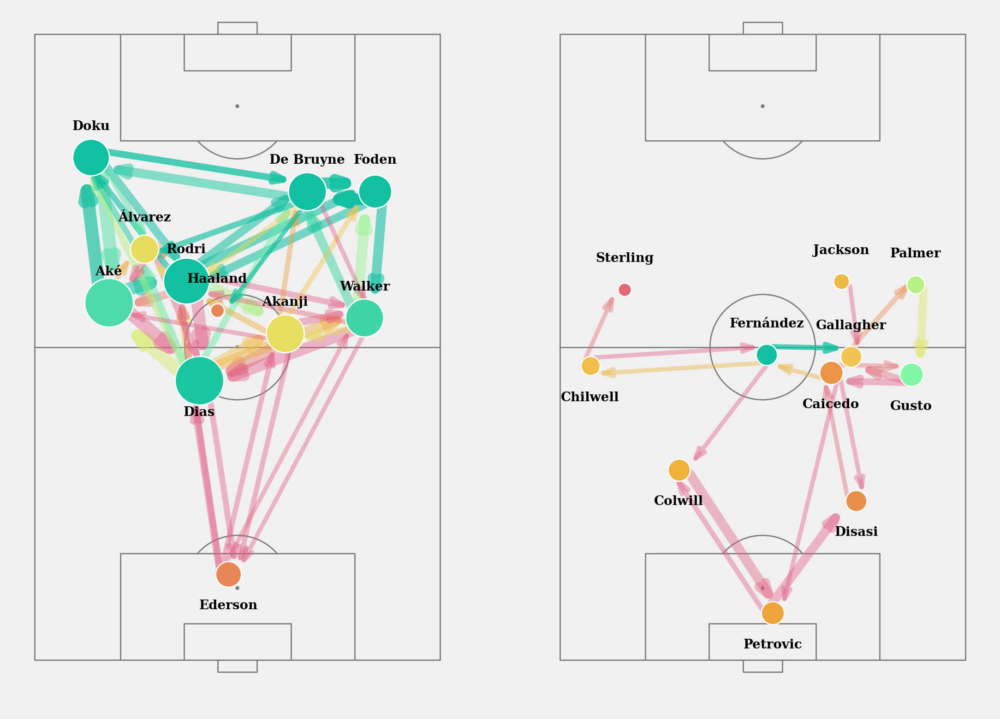

In [18]:
plt.style.use('fivethirtyeight')

fig,ax = plt.subplots(1,2,figsize=(6,6), dpi=400)

teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

for i, teamid in enumerate([teamId_home, teamId_away]):    

    #define dataframes
    position = res_dict[teamid]['player_position']
    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']
    player_pass_value = res_dict[teamid]['player_pass_value']
    pair_pass_value = res_dict[teamid]['pair_pass_value']
    minutes_ = res_dict[teamid]['minutes']

    pitch = VerticalPitch(pitch_type='opta', 
                          line_color='#7c7c7c',
                          goal_type='box',
                          linewidth=0.5,
                        pad_bottom=10)
    
    #plot vertical pitches
    pitch.draw(ax=ax[i], constrained_layout=False, tight_layout=False)
    
    # Step 1: processing for plotting edges
    pair_stats = pd.merge(pair_pass_count, pair_pass_value, left_index=True, right_index=True)
    pair_stats = pair_stats.sort_values('num_passes',ascending=False)
    pair_stats2 = pair_stats[pair_stats['num_passes'] >= 5]
    
    # Step 2: processing for plotting nodes
    player_stats = pd.merge(player_pass_count, player_pass_value, left_index=True, right_index=True)
    
    #FILTER first 11 players
    mask = events_df['minute'] < minutes_
    players_ = list(set(events_df[mask]['playerName'].dropna()))
    
    mask_ = player_stats.index.map(lambda x: x in players_)
    player_stats = player_stats.loc[mask_]
    
    mask_ = pair_stats2.index.map(lambda x: (x.split('_')[0] in players_) &  (x.split('_')[1] in players_))
    pair_stats2 = pair_stats2[mask_]
    
    ind = position.index.map(lambda x: x in players_)
    position = position.loc[ind]
    
    
    # Step 3: plotting nodes
    for var, row in player_stats.iterrows():
        player_x = position.loc[var]["x"]
        player_y = position.loc[var]["y"]
        
        

        num_passes = row["num_passes"]
        pass_value = row["pass_value"]

        marker_size = change_range(num_passes, (min_player_count, max_player_count), (min_node_size, max_node_size))
        norm = Normalize(vmin=min_player_value, vmax=max_player_value)
#         node_cmap = cm.get_cmap(nodes_cmap)
        node_color = node_cmap(norm(pass_value)) 
#         print(node_color)
#         node_color = tuple([0.9 if n == 3 else i for n, i in enumerate(node_color)])

        ax[i].plot(player_x, player_y, '.', color=node_color, markersize=marker_size, zorder=5)
        ax[i].plot(player_x, player_y, '.', markersize=marker_size+2, zorder=4, color='white')

        var_ = ' '.join(var.split(' ')[1:]) if len(var.split(' ')) > 1 else var
        ax[i].annotate(var_, xy=(player_x, player_y+5 if player_y > 48 else player_y - 5), ha="center", va="center", zorder=7,
                    fontsize=5, 
#                     color=tuple([min(i*1.5, 1) if n != 3 else 1 for n, i in enumerate(node_color)]), 
                    color = 'black',
                    font = 'serif',
                    weight='heavy')

        player_stats.loc[var, 'marker_size'] = marker_size
        


    # Step 4: ploting edges  
    for pair_key, row in pair_stats2.iterrows():
        player1, player2 = pair_key.split("_")

        player1_x = position.loc[player1]["x"]
        player1_y = position.loc[player1]["y"]

        player2_x = position.loc[player2]["x"]
        player2_y = position.loc[player2]["y"]

        num_passes = row["num_passes"]
        pass_value = row["pass_value"]

        line_width = change_range(num_passes, (min_pair_count, max_pair_count), (min_edge_width, max_edge_width))
        alpha = change_range(pass_value, (min_player_value, max_player_value), (0.4, 1))

        norm = Normalize(vmin=min_pair_value, vmax=max_pair_value)
        edge_cmap = cm.get_cmap(nodes_cmap)
        edge_color = edge_cmap(norm(pass_value))

        x = player1_x
        y = player1_y
        dx = player2_x-player1_x
        dy = player2_y-player1_y
        rel = 68/105
        shift_x = 2
        shift_y = shift_x*rel

        slope = round(abs((player2_y - player1_y)*105/100 / (player2_x - player1_x)*68/100),1)

        mutation_scale = 1
        if (slope > 0.5):
            if dy > 0:
                ax[i].annotate("", xy=(x+dx+shift_x, y+dy), xytext=(x+shift_x, y),zorder=2,
                        arrowprops=dict(arrowstyle=f'->, head_length = {head_length}, head_width={head_width}',
                                        color=tuple([alpha if n == 3 else i for n, i in enumerate(edge_color)]),
                                        fc = 'blue',
                                        lw=line_width,
                                        shrinkB=player_stats.loc[player2, 'marker_size']/5))
                
                
            elif dy <= 0:
                ax[i].annotate("", xy=(x+dx-shift_x, y+dy), xytext=(x-shift_x, y),zorder=2,
                        arrowprops=dict(arrowstyle=f'->, head_length = {head_length}, head_width={head_width}',
                                        color=tuple([alpha if n == 3 else i for n, i in enumerate(edge_color)]),
                                        fc = 'blue',
                                        lw=line_width,
                                        shrinkB=player_stats.loc[player2, 'marker_size']/5))
                
        elif (slope <= 0.5) & (slope >=0):
            if dx > 0:
#                 print(2)

                ax[i].annotate( "", xy=(x+dx, y+dy-shift_y), xytext=(x, y-shift_y),zorder=2,
                        arrowprops=dict(arrowstyle=f'->, head_length = {head_length}, head_width={head_width}',
                                        color=tuple([alpha if n == 3 else i for n, i in enumerate(edge_color)]),
                                        fc = 'blue',
                                        lw=line_width,
                                        shrinkB=player_stats.loc[player2, 'marker_size']/5))

            elif dx <= 0:

                ax[i].annotate("", xy=(x+dx, y+dy+shift_y), xytext=(x, y+shift_y),zorder=2,
                        arrowprops=dict(arrowstyle=f'->, head_length = {head_length}, head_width={head_width}',
                                        color=tuple([alpha if n == 3 else i for n, i in enumerate(edge_color)]),
                                        fc = 'blue',
                                        lw=line_width,
                                        shrinkB=player_stats.loc[player2, 'marker_size']/5))
        else:
            print(1)

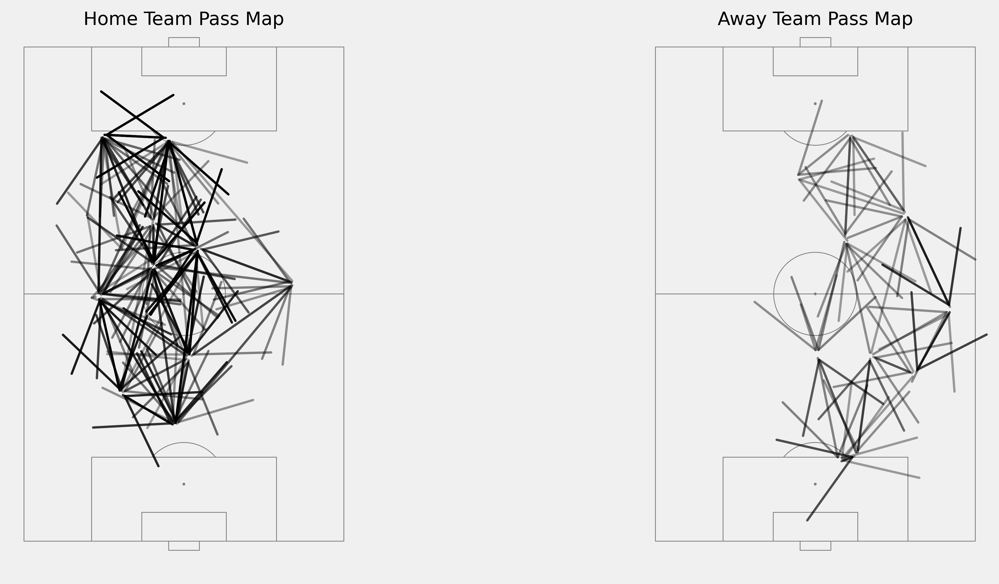

In [19]:
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
from matplotlib.colors import Normalize
from mplsoccer import VerticalPitch

# 스타일 적용
plt.style.use('fivethirtyeight')

# 캔버스 설정 (왼쪽: 맨시티, 오른쪽: 첼시)
fig, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=400)

# 홈팀과 원정팀 ID 가져오기
teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

# 각 선수의 고정 위치를 계산하는 함수
def calculate_fixed_positions(events_df, teamid):
    players_positions = events_df[events_df['teamId'] == teamid][['playerName', 'x', 'y']].dropna()
    fixed_positions = players_positions.groupby('playerName')[['x', 'y']].mean()
    return fixed_positions

# 엣지 색상 범위 설정
min_edge_alpha = 0.2
max_edge_alpha = 1.0

for i, teamid in enumerate([teamId_home, teamId_away]):
    # 고정된 선수 위치 계산
    fixed_positions = calculate_fixed_positions(events_df, teamid)

    # 데이터 프레임 설정
    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']
    pair_pass_value = res_dict[teamid]['pair_pass_value']

    # 필터링을 위한 전체 시간 범위 설정
    minutes_ = (0, 94)

    # 피치 그리기
    pitch = VerticalPitch(pitch_type='opta',
                          line_color='#7c7c7c',
                          goal_type='box',
                          linewidth=0.5,
                          pad_bottom=10)
    pitch.draw(ax=ax[i], constrained_layout=False, tight_layout=False)

    # 엣지 처리 (패스 연결 정보)
    pair_stats = pd.merge(pair_pass_count, pair_pass_value, left_index=True, right_index=True)
    pair_stats = pair_stats.sort_values('num_passes', ascending=False)
    pair_stats2 = pair_stats[pair_stats['num_passes'] >= 4]  # 패스 횟수 필터링

    # 노드 처리 (선수 정보)
    player_stats = pd.merge(player_pass_count, pair_pass_value, left_index=True, right_index=True)
    players_ = fixed_positions.index  # 고정된 위치의 선수들

    # 노드 그리기
    for var, row in player_stats.iterrows():
        if var not in fixed_positions.index:  # 위치 정보가 없는 선수 무시
            continue

        player_x = fixed_positions.loc[var]["x"]
        player_y = fixed_positions.loc[var]["y"]

        num_passes = row["num_passes"]
        pass_value = row["pass_value"]

        marker_size = change_range(num_passes, (min_player_count, max_player_count), (min_node_size, max_node_size))
        ax[i].plot(player_x, player_y, '.', color='black', markersize=marker_size, zorder=5)
        ax[i].plot(player_x, player_y, '.', markersize=marker_size + 2, zorder=4, color='white')

        ax[i].annotate(var, xy=(player_x, player_y + 5 if player_y > 48 else player_y - 5),
                       ha="center", va="center", zorder=7, fontsize=5, color='black')

    # 엣지 그리기 (패스 연결)
    for pair_key, row in pair_stats2.iterrows():
        player1, player2 = pair_key.split("_")
        if player1 not in fixed_positions.index or player2 not in fixed_positions.index:  # 위치 정보 없는 선수 무시
            continue

        player1_x = fixed_positions.loc[player1]["x"]
        player1_y = fixed_positions.loc[player1]["y"]
        player2_x = fixed_positions.loc[player2]["x"]
        player2_y = fixed_positions.loc[player2]["y"]

        num_passes = row["num_passes"]
        alpha = change_range(num_passes, (min_pair_count, max_pair_count), (min_edge_alpha, max_edge_alpha))

        ax[i].annotate("", xy=(player2_x, player2_y), xytext=(player1_x, player1_y), zorder=2,
                       arrowprops=dict(arrowstyle=f'->, head_length=3, head_width=2',
                                       color=(0, 0, 0, alpha), lw=1.5))  # RGB + Alpha

    # 팀 이름 표시
    ax[i].set_title(f"{'Home Team' if i == 0 else 'Away Team'} Pass Map", fontsize=12)

plt.show()


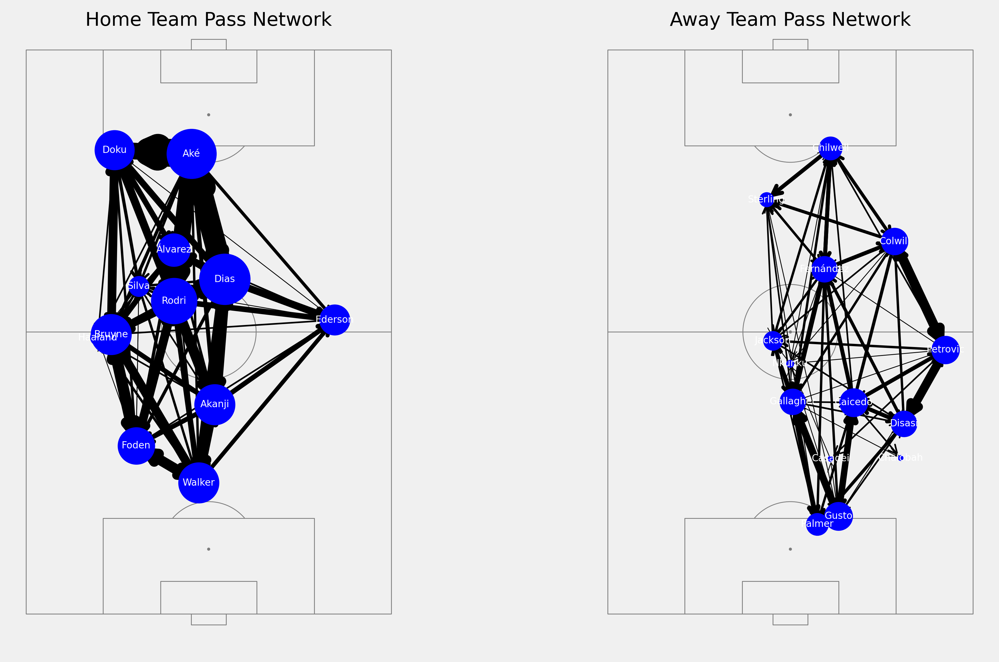

In [20]:
import matplotlib.pyplot as plt
import pandas as pd
from mplsoccer import VerticalPitch
import networkx as nx

# 스타일 적용
plt.style.use('fivethirtyeight')

# 캔버스 설정 (왼쪽: 홈팀, 오른쪽: 원정팀)
fig, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=400)

# 홈팀과 원정팀 ID 가져오기
teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

# 선수 위치 고정 함수
def calculate_fixed_positions(events_df, teamid):
    players_positions = events_df[events_df['teamId'] == teamid][['playerName', 'x', 'y']].dropna()
    fixed_positions = players_positions.groupby('playerName')[['x', 'y']].mean()
    return fixed_positions

for i, teamid in enumerate([teamId_home, teamId_away]):
    # 평균 위치 계산
    fixed_positions = calculate_fixed_positions(events_df, teamid)

    # 데이터프레임 설정
    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']

    # 축구 구장 그리기
    pitch = VerticalPitch(pitch_type='opta',
                          line_color='#7c7c7c',
                          goal_type='box',
                          linewidth=0.5,
                          pad_bottom=10)
    pitch.draw(ax=ax[i])

    # 네트워크 생성
    G = nx.DiGraph()
    for pair_key, row in pair_pass_count.iterrows():
        player1, player2 = pair_key.split("_")
        if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row["num_passes"]):
            G.add_edge(player1, player2, weight=row["num_passes"])

    # 노드 크기 및 위치 설정
    node_sizes = []
    pos = {player: (fixed_positions.loc[player]["x"], fixed_positions.loc[player]["y"]) for player in fixed_positions.index}
    for player, row in player_pass_count.iterrows():
        if player in fixed_positions.index:
            node_sizes.append(row["num_passes"] * 10)  # 크기 비율 조정

    # 엣지 그리기 (패스 연결)
    for edge in G.edges(data=True):
        player1, player2, data = edge
        player1_x, player1_y = pos[player1]
        player2_x, player2_y = pos[player2]
        weight = data['weight']

        # weight가 유효한지 확인하고 그리기
        if pd.notna(weight):
            ax[i].annotate("",
                           xy=(player2_x, player2_y), xytext=(player1_x, player1_y),
                           arrowprops=dict(arrowstyle="->", color='black', lw=float(weight) / 2))

    # 노드 그리기
    for player, (x, y) in pos.items():
        ax[i].scatter(x, y, s=node_sizes.pop(0), color='blue', zorder=5)
        ax[i].text(x, y, player.split()[-1], fontsize=6, ha='center', va='center', color='white', zorder=6)

    # 팀 이름 설정
    team_name = "Home Team" if i == 0 else "Away Team"
    ax[i].set_title(f"{team_name} Pass Network", fontsize=12)

plt.tight_layout()
plt.show()


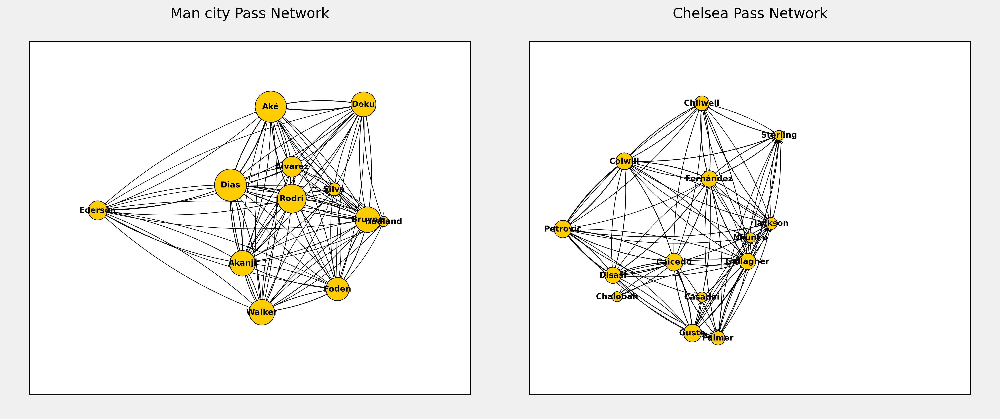

In [21]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Rectangle
import networkx as nx

plt.style.use('fivethirtyeight')

fig, ax = plt.subplots(1, 2, figsize=(14, 6), dpi=400)

teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

def calculate_fixed_positions(events_df, teamid):
    players_positions = events_df[events_df['teamId'] == teamid][['playerName', 'x', 'y']].dropna()
    fixed_positions = players_positions.groupby('playerName')[['x', 'y']].mean()
    fixed_positions['x'] = fixed_positions['x'] * 2.5
    fixed_positions['y'] = fixed_positions['y'] * 2.5
    return fixed_positions

# 노드 컨셉
node_color = "#ffcc00"  
node_font_color = "black"  
edge_color = "black"  
min_edge_width = 0.5
max_edge_width = 2.0
min_node_size = 100  

for i, teamid in enumerate([teamId_home, teamId_away]):
    # 선수들의 평균 위치 계산
    fixed_positions = calculate_fixed_positions(events_df, teamid)

    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']

    ax[i].add_patch(Rectangle((0, 0), 250, 250, fill=True, facecolor='white', edgecolor='black', linewidth=1))

    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].axis('off')

    # 네트워크 생성 시작!
    G = nx.DiGraph()
    # 교체 선수가 있을 경우 그 선수의 노드도 추가
    for player in fixed_positions.index:
        G.add_node(player)

    # 엣지 추가
    for pair_key, row in pair_pass_count.iterrows():
        player1, player2 = pair_key.split("_")
        if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row["num_passes"]):
            G.add_edge(player1, player2, weight=row["num_passes"])

    # 노드 컨셉2(위치)
    pos = {player: (fixed_positions.loc[player]["x"], fixed_positions.loc[player]["y"]) for player in fixed_positions.index}
    node_sizes = [max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size for player in fixed_positions.index]

    # 엣지 그리는 코드 : 패스 연결
    for edge in G.edges(data=True):
        player1, player2, data = edge
        player1_x, player1_y = pos[player1]
        player2_x, player2_y = pos[player2]
        weight = data['weight']

        if pd.notna(weight):
            edge_width = min_edge_width + (max_edge_width - min_edge_width) * (weight / player_pass_count['num_passes'].max())
            ax[i].annotate("",
                           xy=(player2_x, player2_y), xytext=(player1_x, player1_y),
                           arrowprops=dict(arrowstyle="->", color=edge_color, lw=edge_width,
                                           connectionstyle="arc3,rad=0.1"))

    # 노드 그리기 코드
    for player, (x, y) in pos.items():
        size = max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size
        ax[i].scatter(x, y, s=size, color=node_color, edgecolors='black', linewidth=0.6, zorder=5)
        ax[i].text(x, y, player.split()[-1], fontsize=8, ha='center', va='center', color=node_font_color, weight='bold', zorder=6)

    team_name = "Man city" if i == 0 else "Chelsea"
    ax[i].set_title(f"{team_name} Pass Network", fontsize=14)

plt.tight_layout()
plt.show()


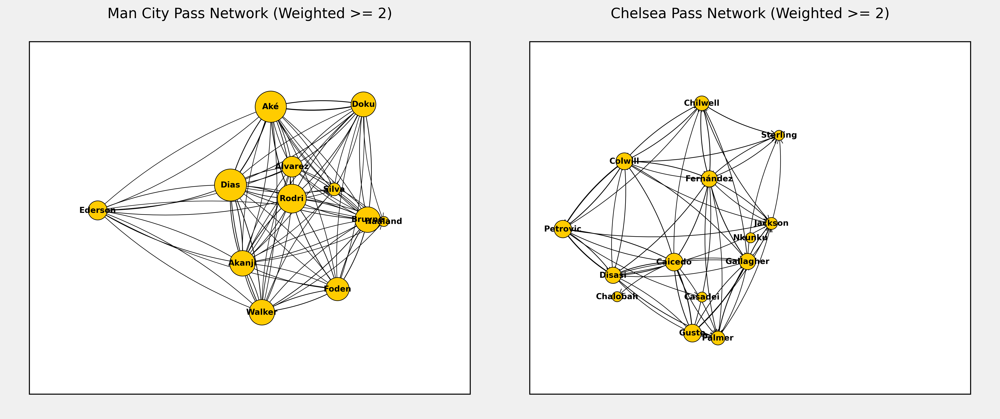

In [22]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Rectangle
import networkx as nx

plt.style.use('fivethirtyeight')

# 2개의 서브플롯을 생성하여 각 팀의 네트워크를 그리기 위한 설정
fig, ax = plt.subplots(1, 2, figsize=(14, 6), dpi=400)

# 홈 팀과 원정 팀의 ID 가져오기
teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

# 선수들의 평균 위치 계산 함수 정의
def calculate_fixed_positions(events_df, teamid):
    players_positions = events_df[events_df['teamId'] == teamid][['playerName', 'x', 'y']].dropna()
    fixed_positions = players_positions.groupby('playerName')[['x', 'y']].mean()
    fixed_positions['x'] = fixed_positions['x'] * 2.5
    fixed_positions['y'] = fixed_positions['y'] * 2.5
    return fixed_positions

# 노드 스타일 설정
node_color = "#ffcc00"  
node_font_color = "black"  
edge_color = "black"  
min_edge_width = 0.5
max_edge_width = 2.0
min_node_size = 100  

# 홈 팀과 원정 팀에 대해 각각 패스 네트워크 그리기
for i, teamid in enumerate([teamId_home, teamId_away]):
    # 선수들의 평균 위치 계산
    fixed_positions = calculate_fixed_positions(events_df, teamid)

    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']

    # 그래프를 그릴 축 설정
    ax[i].add_patch(Rectangle((0, 0), 250, 250, fill=True, facecolor='white', edgecolor='black', linewidth=1))

    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].axis('off')

    # 네트워크 생성 시작!
    G = nx.DiGraph()
    # 교체 선수가 있을 경우 그 선수의 노드도 추가
    for player in fixed_positions.index:
        G.add_node(player)

    # 엣지 추가 (가중치 2 이상인 엣지만 추가)
    for pair_key, row in pair_pass_count.iterrows():
        player1, player2 = pair_key.split("_")
        if (
            player1 in fixed_positions.index 
            and player2 in fixed_positions.index 
            and pd.notna(row["num_passes"]) 
            and row["num_passes"] >= 2  # 가중치(패스 횟수) 조건 추가
        ):
            G.add_edge(player1, player2, weight=row["num_passes"])

    # 노드 위치 설정
    pos = {player: (fixed_positions.loc[player]["x"], fixed_positions.loc[player]["y"]) for player in fixed_positions.index}
    node_sizes = [max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size for player in fixed_positions.index]

    # 엣지 그리기 (가중치 고려)
    for edge in G.edges(data=True):
        player1, player2, data = edge
        player1_x, player1_y = pos[player1]
        player2_x, player2_y = pos[player2]
        weight = data['weight']

        if pd.notna(weight) and weight >= 2:  # 가중치 조건을 다시 확인 (필터링된 엣지만 추가)
            edge_width = min_edge_width + (max_edge_width - min_edge_width) * (weight / player_pass_count['num_passes'].max())
            ax[i].annotate("",
                           xy=(player2_x, player2_y), xytext=(player1_x, player1_y),
                           arrowprops=dict(arrowstyle="->", color=edge_color, lw=edge_width,
                                           connectionstyle="arc3,rad=0.1"))

    # 노드 그리기 코드
    for player, (x, y) in pos.items():
        size = max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size
        ax[i].scatter(x, y, s=size, color=node_color, edgecolors='black', linewidth=0.6, zorder=5)
        ax[i].text(x, y, player.split()[-1], fontsize=8, ha='center', va='center', color=node_font_color, weight='bold', zorder=6)

    # 팀 이름 설정
    team_name = "Man City" if i == 0 else "Chelsea"
    ax[i].set_title(f"{team_name} Pass Network (Weighted >= 2)", fontsize=14)

# 레이아웃 조정 및 그래프 표시
plt.tight_layout()
plt.show()


In [23]:
import pandas as pd
import networkx as nx
from itertools import combinations

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # 코드 12: A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # 코드 14: A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # 코드 74: A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # 코드 36: A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # 코드 6: A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # 코드 98: A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # 코드 78: A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 102: A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 110: A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # 코드 108: A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # 코드 38: A > B > C < A (반시계 방향 후 시계 방향)
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # 코드 46: A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # 코드 238: A <> B <> C <> A (모든 노드 쌍방향)
}

# 팀 그래프 리스트 정의
team_graphs = []

# 앞서 제공된 두 팀의 패스 네트워크 생성 코드 활용
for i, teamid in enumerate([teamId_home, teamId_away]):
    # 선수들의 평균 위치 계산
    fixed_positions = calculate_fixed_positions(events_df, teamid)

    player_pass_count = res_dict[teamid]['player_pass_count']
    pair_pass_count = res_dict[teamid]['pair_pass_count']

    # 네트워크 생성 시작!
    G = nx.DiGraph()
    # 교체 선수가 있을 경우 그 선수의 노드도 추가
    for player in fixed_positions.index:
        G.add_node(player)

    # 엣지 추가 (최소 패스 횟수 2회 이상인 경우만 추가)
    for pair_key, row in pair_pass_count.iterrows():
        player1, player2 = pair_key.split("_")
        if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row["num_passes"]) and row["num_passes"] >= 2:
            G.add_edge(player1, player2, weight=row["num_passes"])

    # 생성된 그래프를 team_graphs에 추가
    team_graphs.append(G)

# 모티프 카운트 계산 함수 정의
def count_motifs_in_team_graph(team_graph, motif_graphs):
    motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
    for nodes in combinations(team_graph.nodes(), 3):
        subgraph = team_graph.subgraph(nodes)
        # 서브그래프에서 가중치 조건 적용: 가중치가 2 이상인 엣지만 고려
        valid_subgraph = nx.DiGraph()
        for u, v, data in subgraph.edges(data=True):
            if data.get('weight', 0) >= 2:  # 가중치가 2 이상인 경우만 엣지 추가
                valid_subgraph.add_edge(u, v, weight=data['weight'])
        
        # 유효한 서브그래프만 모티프 비교에 사용
        for motif_code, motif_graph in motif_graphs.items():
            if nx.is_isomorphic(valid_subgraph, motif_graph):
                motif_counts[motif_code] += 1
    return motif_counts

# 각 팀에 대한 모티프 카운트 계산
team_names = ["Man City", "Chelsea"]
motif_counts_results = {}

for team_name, team_graph in zip(team_names, team_graphs):
    motif_counts_results[team_name] = count_motifs_in_team_graph(team_graph, motif_graphs)

# 결과를 데이터프레임으로 정리
motif_counts_df = pd.DataFrame(motif_counts_results).fillna(0).astype(int)
motif_counts_df.index.name = "Motif Code"
motif_counts_df.columns.name = "Team"

# 모티프 카운트 결과 출력
print(motif_counts_df)


Team        Man City  Chelsea
Motif Code                   
12                 2       10
14                25       26
74                14       18
36                 3        8
6                  3        6
98                 0        3
78                22       10
102               15       10
110               47       24
108                2        5
38                 1        6
46                 8       11
238               64        7


In [24]:
#맨시티는 교체카드 한장 사용 노드 수 12
#첼시는 교체카드 세장 사용 노드 수 14
#맨시티가 홈구장


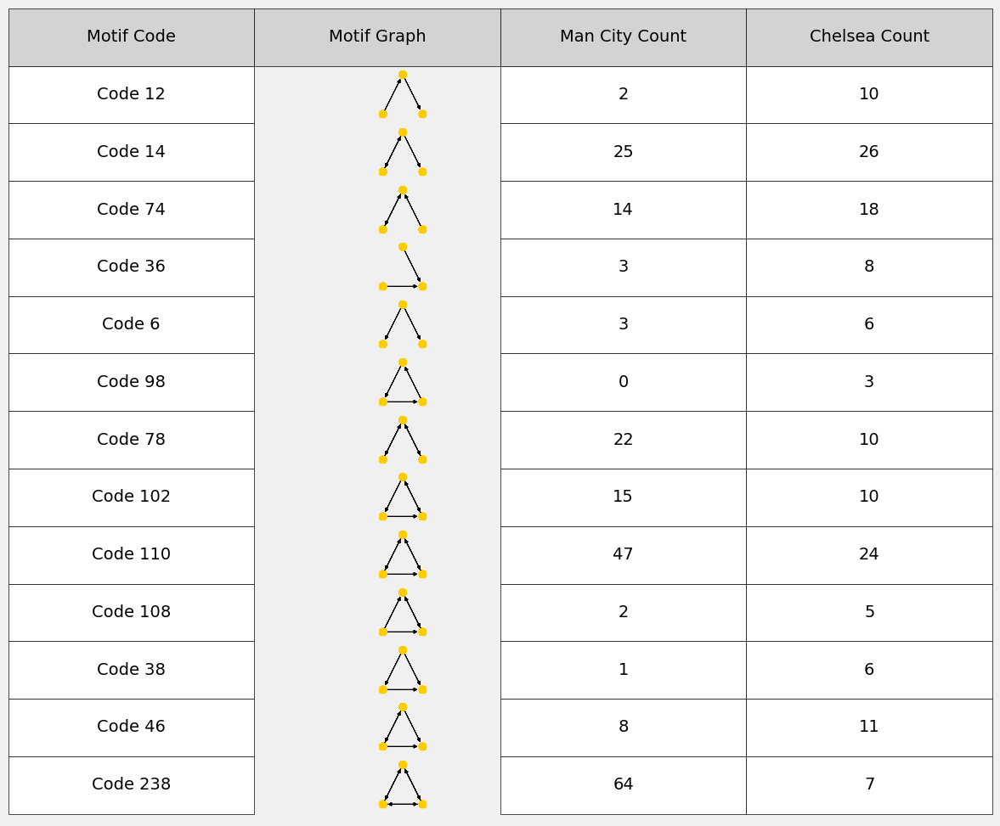

In [25]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.table import Table
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # 코드 12: A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # 코드 14: A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # 코드 74: A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # 코드 36: A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # 코드 6: A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # 코드 98: A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # 코드 78: A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 102: A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 110: A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # 코드 108: A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # 코드 38: A > B > C < A (반시계 방향 후 시계 방향)
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # 코드 46: A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # 코드 238: A <> B <> C <> A (모든 노드 쌍방향)
}

# 그림 파일을 저장할 디렉토리 생성
os.makedirs("motif_images", exist_ok=True)

# B를 위에 배치한 역삼각형 노드 위치 지정
fixed_pos = {1: (0.5, 1), 0: (0, 0), 2: (1, 0)}  # B를 위에 두고, A와 C를 좌우 아래에 배치

# 각 모티프의 그림을 생성하고 저장 (엣지와 화살표 굵기 강조, 노드 위치 고정)
for motif_id, G in motif_graphs.items():
    plt.figure(figsize=(2, 2))
    nx.draw(G, 
            pos=fixed_pos,  # 노드 위치를 B가 위로 오도록 고정
            with_labels=False, 
            node_color="#ffcc00", 
            node_size=700, 
            edge_color="black", 
            arrows=True, 
            arrowsize=20,  # 화살표 크기 증가
            width=4)  # 엣지 두께 증가
    plt.axis('off')
    plt.savefig(f"motif_images/motif_{motif_id}.png", bbox_inches='tight')
    plt.close()

# 반영된 모티프 카운트 결과
motif_counts = {
    "Motif Code": [12, 14, 74, 36, 6, 98, 78, 102, 110, 108, 38, 46, 238],
    "Man City": [2, 25, 14, 3, 3, 0, 22, 15, 47, 2, 1, 8, 64],
    "Chelsea": [10, 26, 18, 8, 6, 3, 10, 10, 24, 5, 6, 11, 7]
}

motif_df = pd.DataFrame(motif_counts)

# 테이블 및 그림 시각화
fig, ax = plt.subplots(figsize=(12, 10))
ax.axis('off')

# 테이블을 위한 빈 테이블 객체 생성
table = Table(ax, bbox=[0, 0, 1, 1])

# 열 너비 및 행 높이 설정
nrows, ncols = motif_df.shape[0], motif_df.shape[1] + 1
width, height = 1.0 / ncols, 1.0 / (nrows + 1)

# 테이블 헤더 추가
columns = ['Motif Code', 'Motif Graph', 'Man City Count', 'Chelsea Count']
for i, column in enumerate(columns):
    table.add_cell(0, i, width, height, text=column, loc='center', facecolor='lightgrey')

# 각 모티프에 대한 행 추가
for i, row in enumerate(motif_df.itertuples(), 1):
    # 모티프 코드 (Code 12 형식으로 추가)
    table.add_cell(i, 0, width, height, text=f"Code {row[1]}", loc='center')
    
    # 모티프 그림 삽입
    img_path = f"motif_images/motif_{row[1]}.png"
    cell_img = plt.imread(img_path)
    imagebox = OffsetImage(cell_img, zoom=0.2)
    ab = AnnotationBbox(imagebox, (0.15 + width, 1 - (i + 0.5) * height), frameon=False, box_alignment=(0.5, 0.5))
    ax.add_artist(ab)
    
    # Man City 및 Chelsea 카운트 추가
    table.add_cell(i, 2, width, height, text=str(row[2]), loc='center')
    table.add_cell(i, 3, width, height, text=str(row[3]), loc='center')

# 테이블 객체 추가
ax.add_table(table)

plt.tight_layout()
plt.show()


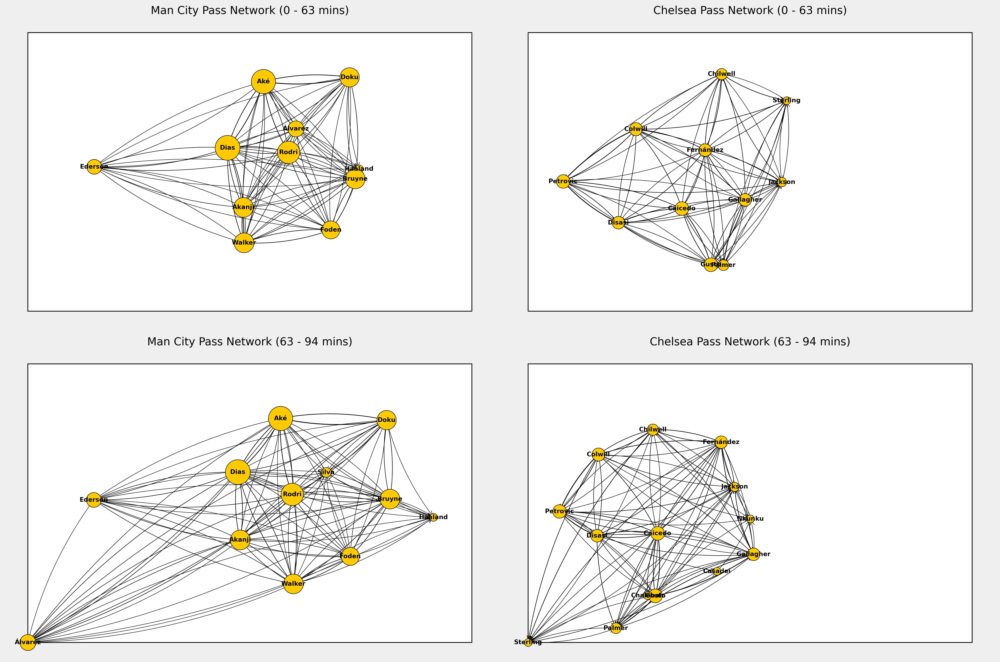

In [26]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Rectangle
import networkx as nx

plt.style.use('fivethirtyeight')

# 4개의 서브플롯을 생성하여 각 시간대별 네트워크를 그리기 위한 설정
fig, ax = plt.subplots(2, 2, figsize=(18, 12), dpi=400)

# 팀 ID 정보 가져오기
teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

def calculate_fixed_positions(events_df, teamid):
    players_positions = events_df[events_df['teamId'] == teamid][['playerName', 'x', 'y']].dropna()
    fixed_positions = players_positions.groupby('playerName')[['x', 'y']].mean()
    fixed_positions['x'] = fixed_positions['x'] * 2.5
    fixed_positions['y'] = fixed_positions['y'] * 2.5
    return fixed_positions

# 노드 스타일
node_color = "#ffcc00"
node_font_color = "black"
edge_color = "black"
min_edge_width = 0.5
max_edge_width = 2.0
min_node_size = 100

# 시간 구간 정의
time_ranges = [(0, 63), (63, 94)]

# 각 시간 구간과 팀에 대해 패스 네트워크 그리기
for row, (start_time, end_time) in enumerate(time_ranges):
    for col, teamid in enumerate([teamId_home, teamId_away]):
        # 현재 시간 구간에 해당하는 이벤트 필터링
        events_in_range = events_df[(events_df['minute'] >= start_time) & (events_df['minute'] < end_time) & (events_df['teamId'] == teamid)]

        # 선수들의 평균 위치 계산
        fixed_positions = calculate_fixed_positions(events_in_range, teamid)

        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        ax[row, col].add_patch(Rectangle((0, 0), 250, 250, fill=True, facecolor='white', edgecolor='black', linewidth=1))

        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])
        ax[row, col].set_xticklabels([])
        ax[row, col].set_yticklabels([])
        ax[row, col].axis('off')

        # 네트워크 생성 시작
        G = nx.DiGraph()
        # 교체 선수가 있을 경우 그 선수의 노드도 추가
        for player in fixed_positions.index:
            G.add_node(player)

        # 엣지 추가
        for pair_key, row_data in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row_data["num_passes"]):
                G.add_edge(player1, player2, weight=row_data["num_passes"])

        # 노드 위치 설정
        pos = {player: (fixed_positions.loc[player]["x"], fixed_positions.loc[player]["y"]) for player in fixed_positions.index}
        node_sizes = [max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size for player in fixed_positions.index]

        # 엣지 그리기 : 패스 연결
        for edge in G.edges(data=True):
            player1, player2, data = edge
            player1_x, player1_y = pos[player1]
            player2_x, player2_y = pos[player2]
            weight = data['weight']

            if pd.notna(weight):
                edge_width = min_edge_width + (max_edge_width - min_edge_width) * (weight / player_pass_count['num_passes'].max())
                ax[row, col].annotate("",
                                      xy=(player2_x, player2_y), xytext=(player1_x, player1_y),
                                      arrowprops=dict(arrowstyle="->", color=edge_color, lw=edge_width,
                                                      connectionstyle="arc3,rad=0.1"))

        # 노드 그리기
        for player, (x, y) in pos.items():
            size = max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size
            ax[row, col].scatter(x, y, s=size, color=node_color, edgecolors='black', linewidth=0.6, zorder=5)
            ax[row, col].text(x, y, player.split()[-1], fontsize=8, ha='center', va='center', color=node_font_color, weight='bold', zorder=6)

        # 팀 이름과 시간 구간 설정
        team_name = "Man City" if col == 0 else "Chelsea"
        ax[row, col].set_title(f"{team_name} Pass Network ({start_time} - {end_time} mins)", fontsize=14)

plt.tight_layout()
plt.show()


In [27]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Rectangle
import networkx as nx
from itertools import combinations

plt.style.use('fivethirtyeight')

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # 코드 12: A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # 코드 14: A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # 코드 74: A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # 코드 36: A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # 코드 6: A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # 코드 98: A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # 코드 78: A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 102: A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 110: A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # 코드 108: A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # 코드 38: A > B > C < A (반시계 방향 후 시계 방향)
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # 코드 46: A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # 코드 238: A <> B <> C <> A (모든 노드 쌍방향)
}

# 시간 구간 정의
time_ranges = [(0, 63), (63, 94)]

# 각 시간 구간과 팀에 대해 네트워크 생성 후 모티프 계산
team_names = ["Man City", "Chelsea"]
motif_counts_results = {}

for row, (start_time, end_time) in enumerate(time_ranges):
    for col, teamid in enumerate([teamId_home, teamId_away]):
        # 현재 시간 구간에 해당하는 이벤트 필터링
        events_in_range = events_df[(events_df['minute'] >= start_time) & (events_df['minute'] < end_time) & (events_df['teamId'] == teamid)]

        # 선수들의 평균 위치 계산
        fixed_positions = calculate_fixed_positions(events_in_range, teamid)

        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        # 네트워크 생성 시작
        G = nx.DiGraph()
        # 교체 선수가 있을 경우 그 선수의 노드도 추가
        for player in fixed_positions.index:
            G.add_node(player)

        # 엣지 추가
        for pair_key, row_data in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row_data["num_passes"]):
                G.add_edge(player1, player2, weight=row_data["num_passes"])

        # 모티프 카운트 계산 함수 호출
        motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
        for nodes in combinations(G.nodes(), 3):
            subgraph = G.subgraph(nodes)
            for motif_code, motif_graph in motif_graphs.items():
                if nx.is_isomorphic(subgraph, motif_graph):
                    motif_counts[motif_code] += 1

        # 결과 저장
        team_name = "Man City" if col == 0 else "Chelsea"
        key = f"{team_name} ({start_time}-{end_time} mins)"
        motif_counts_results[key] = motif_counts

# 결과를 데이터프레임으로 정리
motif_counts_df = pd.DataFrame(motif_counts_results).fillna(0).astype(int)
motif_counts_df.index.name = "Motif Code"
motif_counts_df.columns.name = "Team and Time Range"

# 모티프 카운트 결과 출력
print(motif_counts_df)


Team and Time Range  Man City (0-63 mins)  Chelsea (0-63 mins)  \
Motif Code                                                       
12                                      0                    1   
14                                      4                   16   
74                                      3                   14   
36                                      1                    1   
6                                       1                    0   
98                                      0                    0   
78                                      9                   30   
102                                    10                    2   
110                                    51                   42   
108                                     2                    5   
38                                      1                    0   
46                                      5                    4   
238                                    78                   36   

Team and 

In [28]:
print(motif_counts_df.to_string())


Team and Time Range  Man City (0-63 mins)  Chelsea (0-63 mins)  Man City (63-94 mins)  Chelsea (63-94 mins)
Motif Code                                                                                                 
12                                      0                    1                      1                     8
14                                      4                   16                      6                    46
74                                      3                   14                      6                    19
36                                      1                    1                      1                     6
6                                       1                    0                      2                     8
98                                      0                    0                      0                     2
78                                      9                   30                     14                    35
102                         

In [29]:
#여기 아래부터는 패스 가중치 2를 두고 계산

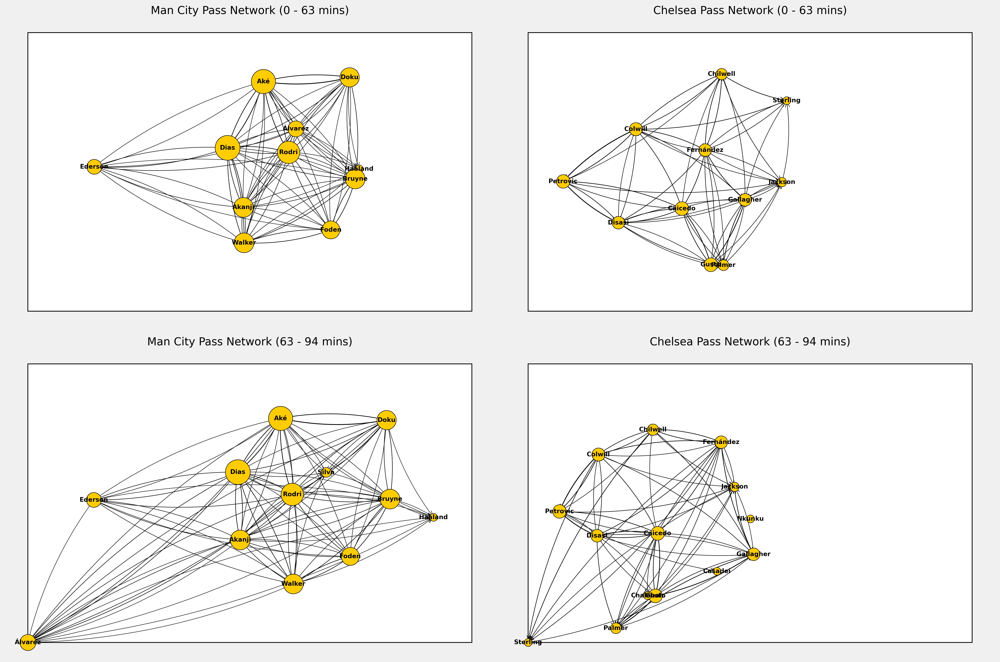

In [30]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Rectangle
import networkx as nx

plt.style.use('fivethirtyeight')

# 4개의 서브플롯을 생성하여 각 시간대별 네트워크를 그리기 위한 설정
fig, ax = plt.subplots(2, 2, figsize=(18, 12), dpi=400)

# 팀 ID 정보 가져오기
teamId_home = events_df[events_df['h_a'] == 'h']['teamId'].unique()[0]
teamId_away = events_df[events_df['h_a'] == 'a']['teamId'].unique()[0]

def calculate_fixed_positions(events_df, teamid):
    players_positions = events_df[events_df['teamId'] == teamid][['playerName', 'x', 'y']].dropna()
    fixed_positions = players_positions.groupby('playerName')[['x', 'y']].mean()
    fixed_positions['x'] = fixed_positions['x'] * 2.5
    fixed_positions['y'] = fixed_positions['y'] * 2.5
    return fixed_positions

# 노드 스타일
node_color = "#ffcc00"
node_font_color = "black"
edge_color = "black"
min_edge_width = 0.5
max_edge_width = 2.0
min_node_size = 100

# 시간 구간 정의
time_ranges = [(0, 63), (63, 94)]

# 각 시간 구간과 팀에 대해 패스 네트워크 그리기
for row, (start_time, end_time) in enumerate(time_ranges):
    for col, teamid in enumerate([teamId_home, teamId_away]):
        # 현재 시간 구간에 해당하는 이벤트 필터링
        events_in_range = events_df[(events_df['minute'] >= start_time) & (events_df['minute'] < end_time) & (events_df['teamId'] == teamid)]

        # 선수들의 평균 위치 계산
        fixed_positions = calculate_fixed_positions(events_in_range, teamid)

        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        ax[row, col].add_patch(Rectangle((0, 0), 250, 250, fill=True, facecolor='white', edgecolor='black', linewidth=1))

        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])
        ax[row, col].set_xticklabels([])
        ax[row, col].set_yticklabels([])
        ax[row, col].axis('off')

        # 네트워크 생성 시작
        G = nx.DiGraph()
        # 교체 선수가 있을 경우 그 선수의 노드도 추가
        for player in fixed_positions.index:
            G.add_node(player)

        # 엣지 추가 (최소 패스 횟수 2회 이상인 경우만 추가)
        for pair_key, row_data in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row_data["num_passes"]) and row_data["num_passes"] >= 2:
                G.add_edge(player1, player2, weight=row_data["num_passes"])

        # 노드 위치 설정
        pos = {player: (fixed_positions.loc[player]["x"], fixed_positions.loc[player]["y"]) for player in fixed_positions.index}
        node_sizes = [max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size for player in fixed_positions.index]

        # 엣지 그리기 : 패스 연결
        for edge in G.edges(data=True):
            player1, player2, data = edge
            player1_x, player1_y = pos[player1]
            player2_x, player2_y = pos[player2]
            weight = data['weight']

            if pd.notna(weight):
                edge_width = min_edge_width + (max_edge_width - min_edge_width) * (weight / player_pass_count['num_passes'].max())
                ax[row, col].annotate("",
                                      xy=(player2_x, player2_y), xytext=(player1_x, player1_y),
                                      arrowprops=dict(arrowstyle="->", color=edge_color, lw=edge_width,
                                                      connectionstyle="arc3,rad=0.1"))

        # 노드 그리기
        for player, (x, y) in pos.items():
            size = max(player_pass_count.loc[player, "num_passes"] * 10, min_node_size) if player in player_pass_count.index else min_node_size
            ax[row, col].scatter(x, y, s=size, color=node_color, edgecolors='black', linewidth=0.6, zorder=5)
            ax[row, col].text(x, y, player.split()[-1], fontsize=8, ha='center', va='center', color=node_font_color, weight='bold', zorder=6)

        # 팀 이름과 시간 구간 설정
        team_name = "Man City" if col == 0 else "Chelsea"
        ax[row, col].set_title(f"{team_name} Pass Network ({start_time} - {end_time} mins)", fontsize=14)

plt.tight_layout()
plt.show()


In [31]:
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
from itertools import combinations

plt.style.use('fivethirtyeight')

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # 코드 12: A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # 코드 14: A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # 코드 74: A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # 코드 36: A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # 코드 6: A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # 코드 98: A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # 코드 78: A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 102: A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 110: A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # 코드 108: A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # 코드 38: A > B > C < A (반시계 방향 후 시계 방향)
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # 코드 46: A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # 코드 238: A <> B <> C <> A (모든 노드 쌍방향)
}

# 시간 구간 정의
time_ranges = [(0, 63), (63, 94)]

# 각 시간 구간과 팀에 대해 네트워크 생성 후 모티프 계산
team_names = ["Man City", "Chelsea"]
motif_counts_results = {}

for row, (start_time, end_time) in enumerate(time_ranges):
    for col, teamid in enumerate([teamId_home, teamId_away]):
        # 현재 시간 구간에 해당하는 이벤트 필터링
        events_in_range = events_df[(events_df['minute'] >= start_time) & (events_df['minute'] < end_time) & (events_df['teamId'] == teamid)]

        # 선수들의 평균 위치 계산
        fixed_positions = calculate_fixed_positions(events_in_range, teamid)

        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        # 네트워크 생성 시작
        G = nx.DiGraph()
        # 교체 선수가 있을 경우 그 선수의 노드도 추가
        for player in fixed_positions.index:
            G.add_node(player)

        # 엣지 추가 (최소 패스 횟수 2회 이상인 경우만 추가)
        for pair_key, row_data in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row_data["num_passes"]) and row_data["num_passes"] >= 2:
                G.add_edge(player1, player2, weight=row_data["num_passes"])

        # 모티프 카운트 계산 함수 호출
        motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
        for nodes in combinations(G.nodes(), 3):
            subgraph = G.subgraph(nodes)
            for motif_code, motif_graph in motif_graphs.items():
                if nx.is_isomorphic(subgraph, motif_graph):
                    motif_counts[motif_code] += 1

        # 결과 저장
        team_name = "Man City" if col == 0 else "Chelsea"
        key = f"{team_name} ({start_time}-{end_time} mins)"
        motif_counts_results[key] = motif_counts

# 결과를 데이터프레임으로 정리
motif_counts_df = pd.DataFrame(motif_counts_results).fillna(0).astype(int)
motif_counts_df.index.name = "Motif Code"
motif_counts_df.columns.name = "Team and Time Range"

# 모티프 카운트 결과 출력
print(motif_counts_df)


Team and Time Range  Man City (0-63 mins)  Chelsea (0-63 mins)  \
Motif Code                                                       
12                                      1                    8   
14                                     13                   19   
74                                      9                   18   
36                                      2                    8   
6                                       1                    2   
98                                      0                    3   
78                                     16                   10   
102                                    11                   10   
110                                    37                   24   
108                                     2                    5   
38                                      1                    6   
46                                      5                   11   
238                                    61                    7   

Team and 

In [32]:
print(motif_counts_df.to_string())

Team and Time Range  Man City (0-63 mins)  Chelsea (0-63 mins)  Man City (63-94 mins)  Chelsea (63-94 mins)
Motif Code                                                                                                 
12                                      1                    8                      2                    10
14                                     13                   19                     25                    26
74                                      9                   18                     14                    18
36                                      2                    8                      3                     8
6                                       1                    2                      3                     6
98                                      0                    3                      0                     3
78                                     16                   10                     22                    10
102                         

In [33]:
#프리미어리그의 평균 한경기 패스는 470

총 노드 수: 15
총 엣지 수: 51

노드별 중심성:
노드 7: 0.7143
노드 13: 0.6429
노드 2: 0.5714
노드 10: 0.5714
노드 1: 0.5000
노드 3: 0.5000
노드 5: 0.5000
노드 6: 0.5000
노드 11: 0.5000
노드 4: 0.4286
노드 8: 0.4286
노드 12: 0.4286
노드 9: 0.3571
노드 14: 0.3571
노드 0: 0.2857


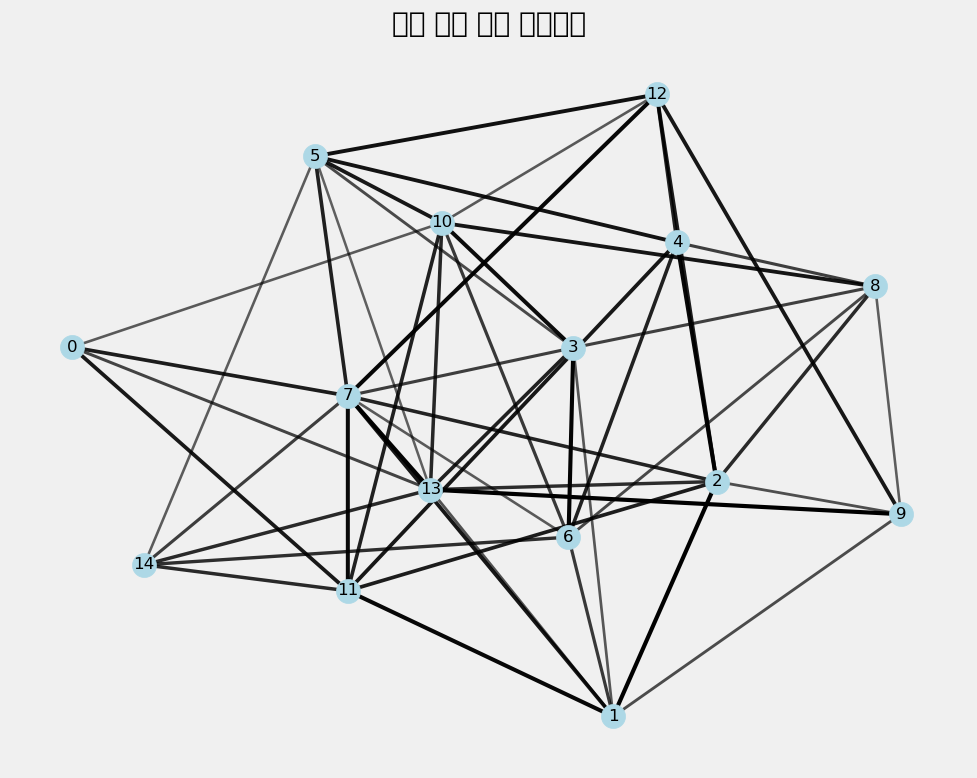

In [34]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

class SoccerPassNetwork:
    def __init__(self, num_players=15, total_passes=470, pass_success_rate=0.75, goal_rate=3):
        """
        축구 패스 랜덤 네트워크 생성
        
        Parameters:
        - num_players: 총 선수 수 (교체 포함)
        - total_passes: 한 경기 총 패스 수
        - pass_success_rate: 패스 성공률
        - goal_rate: 평균 득점률
        """
        self.num_players = num_players
        self.total_passes = total_passes
        self.pass_success_rate = pass_success_rate
        self.goal_rate = goal_rate
        
        # 랜덤 네트워크 생성
        self.G = self.create_random_network()
    
    def create_random_network(self):
        """랜덤 네트워크 생성"""
        # 완전 랜덤 그래프 생성
        G = nx.erdos_renyi_graph(self.num_players, 0.4)
        
        # 각 엣지에 패스 속성 추가
        for (u, v) in G.edges():
            # 패스 성공 확률 속성
            G.edges[u,v]['success_prob'] = np.random.uniform(0.6, 1.0)
            
            # 패스 강도 (랜덤하게 생성)
            G.edges[u,v]['pass_strength'] = np.random.uniform(0.3, 1.0)
        
        return G
    
    def analyze_network(self):
        """네트워크 분석"""
        print(f"총 노드 수: {self.G.number_of_nodes()}")
        print(f"총 엣지 수: {self.G.number_of_edges()}")
        
        # 중심성 계산
        degree_centrality = nx.degree_centrality(self.G)
        print("\n노드별 중심성:")
        for node, centrality in sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True):
            print(f"노드 {node}: {centrality:.4f}")
    
    def visualize_network(self):
        """네트워크 시각화"""
        plt.figure(figsize=(10, 8))
        pos = nx.spring_layout(self.G, seed=42)
        
        # 노드 그리기
        nx.draw_networkx_nodes(self.G, pos, node_color='lightblue', node_size=300)
        
        # 엣지 그리기 (패스 성공 확률에 따라 선 두께 조정)
        for (u, v, data) in self.G.edges(data=True):
            nx.draw_networkx_edges(self.G, pos, edgelist=[(u,v)], 
                                   width=data['success_prob']*3, 
                                   alpha=data['success_prob'])
        
        # 노드 라벨 추가
        nx.draw_networkx_labels(self.G, pos)
        
        plt.title("축구 패스 랜덤 네트워크")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

# 네트워크 생성 및 분석
soccer_network = SoccerPassNetwork()
soccer_network.analyze_network()
soccer_network.visualize_network()

3-노드 모티프 분석 결과

평균 모티프 카운트:
12     56.26
14     37.84
74     37.09
36     27.92
6      27.90
98     12.91
78     12.72
102    25.72
110    15.93
108    12.28
38     38.32
46     13.27
238     1.95
dtype: float64

모티프 카운트 표준편차:
12      9.093921
14      7.775538
74      7.730427
36      6.751999
6       5.564135
98      5.956229
78      6.383501
102     7.407449
110     7.290862
108     4.055374
38     12.846318
46      4.478580
238     1.976503
dtype: float64


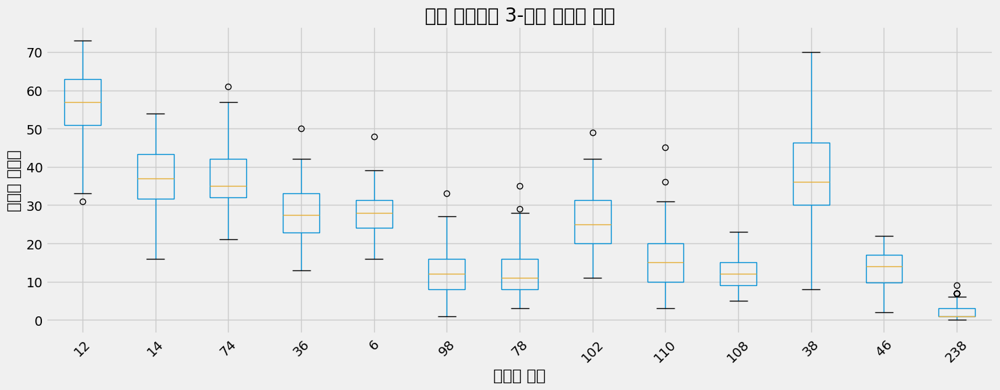

In [35]:
import networkx as nx
import numpy as np
import itertools
import pandas as pd

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),    # A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),    # A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),     # A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # A > B > C < A
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # A <> B <> C <> A
}

class SoccerPassNetworkMotif:
    def __init__(self, num_simulations=100):
        """
        랜덤 네트워크의 3-모티프 분석
        
        Parameters:
        - num_simulations: 모티프 분석을 위한 랜덤 네트워크 생성 횟수
        """
        self.num_simulations = num_simulations
        self.motif_results = []
    
    def generate_random_network(self, num_players=15, edge_prob=0.4):
        """랜덤 방향 그래프 생성"""
        G = nx.erdos_renyi_graph(num_players, edge_prob, directed=True)
        return G
    
    def count_motifs(self, G):
        """
        3-노드 모티프 카운팅
        
        Parameters:
        - G: NetworkX 방향 그래프
        
        Returns:
        - 각 모티프 코드별 카운트 딕셔너리
        """
        motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
        
        # 그래프의 모든 3노드 조합에 대해 반복
        for nodes in itertools.combinations(G.nodes(), 3):
            subgraph = G.subgraph(nodes)
            
            # 각 모티프 그래프와 비교
            for motif_code, motif_graph in motif_graphs.items():
                if nx.is_isomorphic(subgraph, motif_graph):
                    motif_counts[motif_code] += 1
        
        return motif_counts
    
    def run_simulations(self):
        """
        다수의 랜덤 네트워크에 대해 모티프 분석 수행
        
        Returns:
        - 모티프 카운트 결과 데이터프레임
        """
        # 여러 번의 시뮬레이션 수행
        for _ in range(self.num_simulations):
            G = self.generate_random_network()
            motif_counts = self.count_motifs(G)
            self.motif_results.append(motif_counts)
        
        # 결과를 데이터프레임으로 변환
        df = pd.DataFrame(self.motif_results)
        
        # 평균과 표준편차 계산
        mean_df = df.mean()
        std_df = df.std()
        
        # 결과 통계 출력
        print("3-노드 모티프 분석 결과")
        print("\n평균 모티프 카운트:")
        print(mean_df)
        print("\n모티프 카운트 표준편차:")
        print(std_df)
        
        return df
    
    def plot_motif_distribution(self):
        """모티프 분포 시각화"""
        import matplotlib.pyplot as plt
        
        df = self.run_simulations()
        
        plt.figure(figsize=(15, 6))
        df.boxplot()
        plt.title("랜덤 네트워크 3-노드 모티프 분포")
        plt.xlabel("모티프 코드")
        plt.ylabel("모티프 카운트")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# 모티프 분석 실행
motif_analyzer = SoccerPassNetworkMotif(num_simulations=100)
motif_analyzer.plot_motif_distribution()

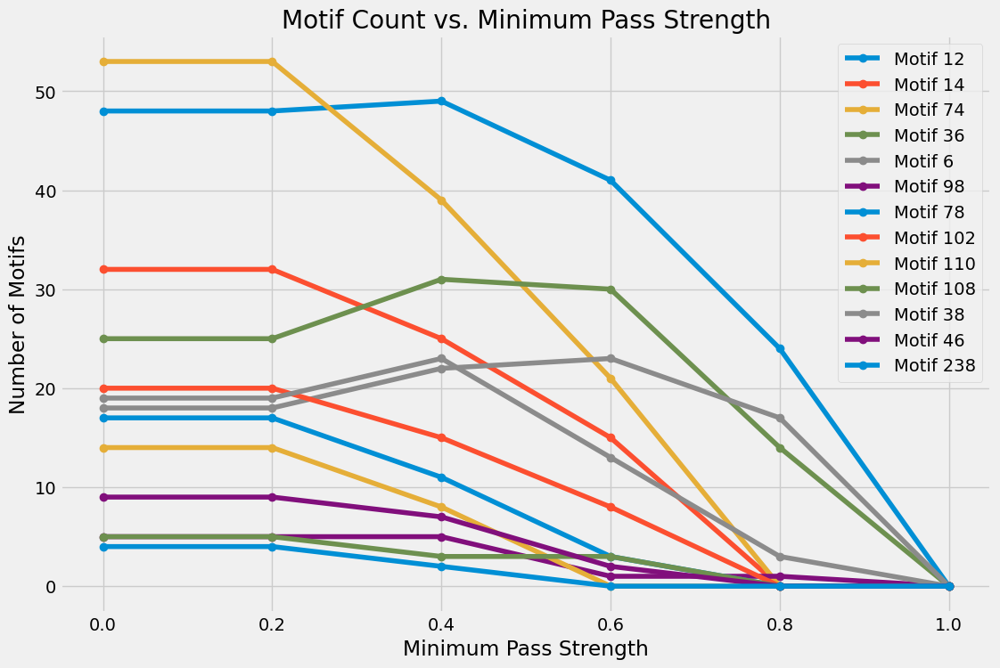

In [36]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import itertools

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),    # A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),    # A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),     # A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # A > B > C < A
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # A <> B <> C <> A
}

class SoccerPassNetwork:
    def __init__(self, num_players=15, total_passes=470, pass_success_rate=0.75, goal_rate=3):
        """
        축구 패스 랜덤 네트워크 생성

        Parameters:
        - num_players: 총 선수 수 (교체 포함)
        - total_passes: 한 경기 총 패스 수
        - pass_success_rate: 패스 성공률
        - goal_rate: 평균 득점률
        """
        self.num_players = num_players
        self.total_passes = total_passes
        self.pass_success_rate = pass_success_rate
        self.goal_rate = goal_rate

        # 랜덤 네트워크 생성
        self.G = self.create_random_network()

    def create_random_network(self):
        """랜덤 네트워크 생성"""
        # 완전 랜덤 그래프 생성
        G = nx.erdos_renyi_graph(self.num_players, 0.4, directed=True)

        # 각 엣지에 패스 속성 추가
        for (u, v) in G.edges():
            # 패스 성공 확률 속성
            G.edges[u, v]['success_prob'] = np.random.uniform(0.6, 1.0)
            # 패스 강도 (랜덤하게 생성)
            G.edges[u, v]['pass_strength'] = np.random.uniform(0.3, 1.0)

        return G

    def filter_edges_by_min_pass_strength(self, min_pass_strength):
        """최소 패스 강도 기준으로 엣지 필터링"""
        filtered_G = self.G.copy()
        edges_to_remove = [(u, v) for u, v, data in self.G.edges(data=True) if data['pass_strength'] < min_pass_strength]
        filtered_G.remove_edges_from(edges_to_remove)
        return filtered_G

    def count_motifs(self, G):
        """모티프 개수 계산"""
        motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}

        # 그래프의 모든 3노드 조합에 대해 반복
        for nodes in itertools.combinations(G.nodes(), 3):
            subgraph = G.subgraph(nodes)

            # 각 모티프 그래프와 비교
            for motif_code, motif_graph in motif_graphs.items():
                if nx.is_isomorphic(subgraph, motif_graph):
                    motif_counts[motif_code] += 1

        return motif_counts

    def analyze_and_visualize_motifs(self):
        """최소 패스 강도를 증가시키며 모티프 개수 분석 및 시각화"""
        min_pass_strengths = np.linspace(0, 1.0, 6)  # 0부터 1까지 5단계로 증가
        motif_counts_over_strengths = {motif_code: [] for motif_code in motif_graphs.keys()}

        for min_strength in min_pass_strengths:
            filtered_G = self.filter_edges_by_min_pass_strength(min_strength)
            motif_counts = self.count_motifs(filtered_G)

            for motif_code, count in motif_counts.items():
                motif_counts_over_strengths[motif_code].append(count)

        # 결과 시각화
        plt.figure(figsize=(12, 8))

        for motif_code, counts in motif_counts_over_strengths.items():
            plt.plot(min_pass_strengths, counts, marker='o', linestyle='-', label=f'Motif {motif_code}')

        plt.title('Motif Count vs. Minimum Pass Strength')
        plt.xlabel('Minimum Pass Strength')
        plt.ylabel('Number of Motifs')
        plt.grid(True)
        plt.legend()
        plt.show()

# 네트워크 생성 및 분석
soccer_network = SoccerPassNetwork()
soccer_network.analyze_and_visualize_motifs()


In [37]:
import pandas as pd
import networkx as nx
from itertools import combinations

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # 코드 12: A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # 코드 14: A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # 코드 74: A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # 코드 36: A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # 코드 6: A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # 코드 98: A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # 코드 78: A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 102: A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # 코드 110: A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # 코드 108: A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # 코드 38: A > B > C < A (반시계 방향 후 시계 방향)
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # 코드 46: A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # 코드 238: A <> B <> C <> A (모든 노드 쌍방향)
}

# 가중치 조건별 결과 저장
weight_conditions = [0, 1, 3, 4, 5]  # 가중치 2는 제외
all_results = {}

# 모티프 카운트 계산 함수
def count_motifs_in_team_graph(team_graph, motif_graphs, weight_threshold):
    motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
    for nodes in combinations(team_graph.nodes(), 3):
        subgraph = team_graph.subgraph(nodes)
        valid_subgraph = nx.DiGraph()
        for u, v, data in subgraph.edges(data=True):
            if data.get('weight', 0) >= weight_threshold:  # 가중치 조건 적용
                valid_subgraph.add_edge(u, v, weight=data['weight'])
        
        # 유효한 서브그래프만 모티프 비교에 사용
        for motif_code, motif_graph in motif_graphs.items():
            if nx.is_isomorphic(valid_subgraph, motif_graph):
                motif_counts[motif_code] += 1
    return motif_counts

# 각 가중치 조건에 따라 모티프 계산
for weight in weight_conditions:
    team_graphs = []
    
    # 각 팀의 네트워크 생성
    for i, teamid in enumerate([teamId_home, teamId_away]):
        fixed_positions = calculate_fixed_positions(events_df, teamid)
        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        G = nx.DiGraph()
        for player in fixed_positions.index:
            G.add_node(player)

        for pair_key, row in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row["num_passes"]) and row["num_passes"] >= weight:
                G.add_edge(player1, player2, weight=row["num_passes"])

        team_graphs.append(G)
    
    # 각 팀에 대한 모티프 카운트 계산
    team_names = ["Man City", "Chelsea"]
    motif_counts_results = {}
    for team_name, team_graph in zip(team_names, team_graphs):
        motif_counts_results[team_name] = count_motifs_in_team_graph(team_graph, motif_graphs, weight)
    
    # 결과 저장
    all_results[f"Weight >= {weight}"] = motif_counts_results

# 결과를 데이터프레임으로 정리
dataframes = {}
for weight, results in all_results.items():
    df = pd.DataFrame(results).fillna(0).astype(int)
    df.index.name = "Motif Code"
    df.columns.name = "Team"
    dataframes[weight] = df

# 결과 출력
for weight, df in dataframes.items():
    print(f"\n=== Motif Counts for Weight >= {weight} ===")
    print(df)



=== Motif Counts for Weight >= Weight >= 0 ===
Team        Man City  Chelsea
Motif Code                   
12                 1        8
14                 6       46
74                 6       19
36                 1        6
6                  2        8
98                 0        2
78                14       35
102               15        8
110               70       43
108                2        6
38                 2        5
46                10       12
238               91       36

=== Motif Counts for Weight >= Weight >= 1 ===
Team        Man City  Chelsea
Motif Code                   
12                 1        8
14                 6       46
74                 6       19
36                 1        6
6                  2        8
98                 0        2
78                14       35
102               15        8
110               70       43
108                2        6
38                 2        5
46                10       12
238               91       36

===

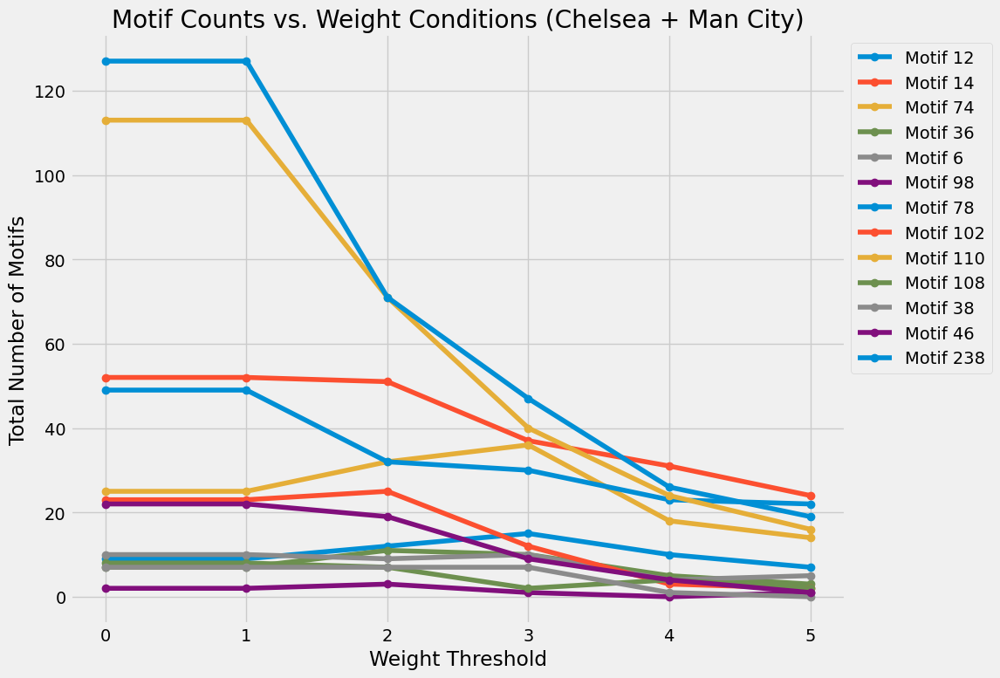

In [38]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
import numpy as np

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # A > B > C < A
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # A <> B <> C <> A (모든 노드 쌍방향)
}

# 모티프 카운트 계산 함수
def count_motifs_in_team_graph(team_graph, motif_graphs, weight_threshold):
    motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
    for nodes in combinations(team_graph.nodes(), 3):
        subgraph = team_graph.subgraph(nodes)
        valid_subgraph = nx.DiGraph()
        for u, v, data in subgraph.edges(data=True):
            if data.get('weight', 0) >= weight_threshold:  # 가중치 조건 적용
                valid_subgraph.add_edge(u, v, weight=data['weight'])
        
        # 유효한 서브그래프만 모티프 비교에 사용
        for motif_code, motif_graph in motif_graphs.items():
            if nx.is_isomorphic(valid_subgraph, motif_graph):
                motif_counts[motif_code] += 1
    return motif_counts

# 가중치 조건별 결과 저장
weight_conditions = [0, 1, 2, 3, 4, 5]
motif_counts_over_weights = {motif_code: [] for motif_code in motif_graphs.keys()}

# 각 가중치 조건에 대해 계산
for weight in weight_conditions:
    total_motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}  # 두 팀 합산
    team_graphs = []

    # 각 팀의 네트워크 생성
    for teamid in [teamId_home, teamId_away]:
        fixed_positions = calculate_fixed_positions(events_df, teamid)
        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        G = nx.DiGraph()
        for player in fixed_positions.index:
            G.add_node(player)

        for pair_key, row in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row["num_passes"]) and row["num_passes"] >= weight:
                G.add_edge(player1, player2, weight=row["num_passes"])

        team_graphs.append(G)

    # 각 팀의 모티프를 합산
    for team_graph in team_graphs:
        team_motif_counts = count_motifs_in_team_graph(team_graph, motif_graphs, weight)
        for motif_code, count in team_motif_counts.items():
            total_motif_counts[motif_code] += count

    # 가중치 조건별로 저장
    for motif_code, count in total_motif_counts.items():
        motif_counts_over_weights[motif_code].append(count)

# 시각화
plt.figure(figsize=(12, 8))

for motif_code, counts in motif_counts_over_weights.items():
    plt.plot(weight_conditions, counts, marker='o', linestyle='-', label=f'Motif {motif_code}')

plt.title('Motif Counts vs. Weight Conditions (Chelsea + Man City)')
plt.xlabel('Weight Threshold')
plt.ylabel('Total Number of Motifs')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.tight_layout()
plt.show()


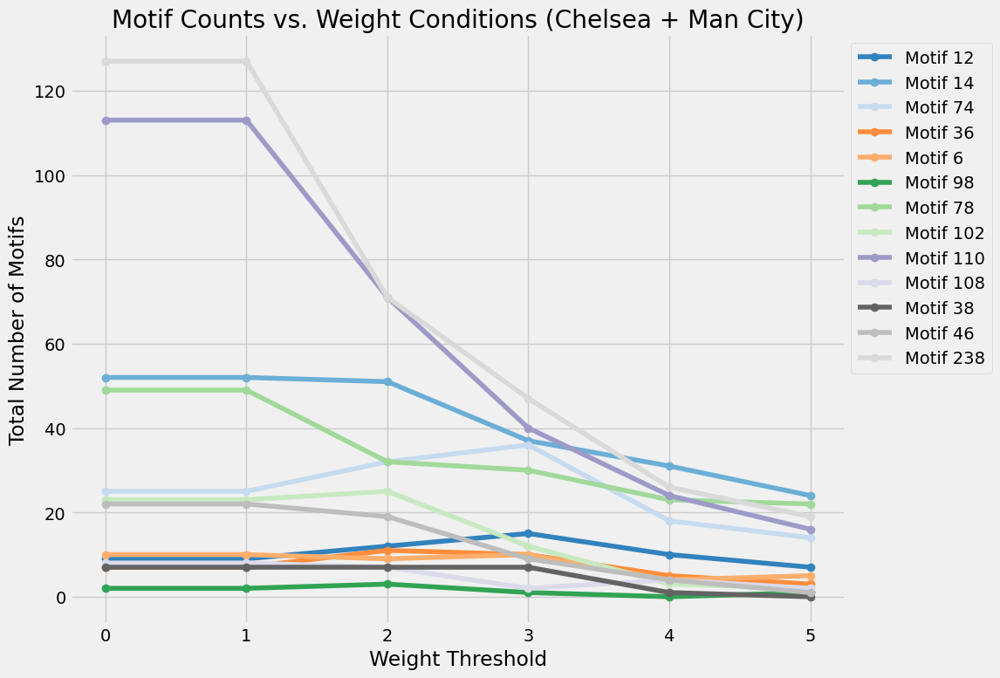

In [40]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import networkx as nx
from itertools import combinations
import numpy as np

# 각 모티프의 그래프 구조 정의
motif_graphs = {
    12: nx.DiGraph([(0, 1), (1, 2)]),  # A > B > C
    14: nx.DiGraph([(0, 1), (1, 0), (1, 2)]),  # A <> B > C
    74: nx.DiGraph([(0, 1), (1, 0), (2, 1)]),  # A <> B < C
    36: nx.DiGraph([(1, 2), (0, 2)]),  # A > B < C
    6: nx.DiGraph([(1, 0), (1, 2)]),  # A < B > C
    98: nx.DiGraph([(1, 0), (0, 2), (2, 1)]),  # A > B > C > A
    78: nx.DiGraph([(0, 1), (1, 0), (1, 2), (2, 1)]),  # A <> B, C <> A
    102: nx.DiGraph([(1, 0), (1, 2), (0, 2), (2, 1)]),  # A > B > C <> A
    110: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2), (2, 1)]),  # A <> B > C <> A
    108: nx.DiGraph([(2, 1), (1, 2), (0, 1), (0, 2)]),  # A < B > C <> A
    38: nx.DiGraph([(1, 0), (1, 2), (0, 2)]),  # A > B > C < A
    46: nx.DiGraph([(0, 1), (1, 0), (1, 2), (0, 2)]),  # A <> B > C < A
    238: nx.DiGraph([(0, 1), (1, 0), (0, 2), (2, 0), (1, 2), (2, 1)])  # A <> B <> C <> A
}

# 모티프 카운트 계산 함수
def count_motifs_in_team_graph(team_graph, motif_graphs, weight_threshold):
    motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}
    for nodes in combinations(team_graph.nodes(), 3):
        subgraph = team_graph.subgraph(nodes)
        valid_subgraph = nx.DiGraph()
        for u, v, data in subgraph.edges(data=True):
            if data.get('weight', 0) >= weight_threshold:  # 가중치 조건 적용
                valid_subgraph.add_edge(u, v, weight=data['weight'])
        
        # 유효한 서브그래프만 모티프 비교에 사용
        for motif_code, motif_graph in motif_graphs.items():
            if nx.is_isomorphic(valid_subgraph, motif_graph):
                motif_counts[motif_code] += 1
    return motif_counts

# 가중치 조건별 결과 저장
weight_conditions = [0, 1, 2, 3, 4, 5]
motif_counts_over_weights = {motif_code: [] for motif_code in motif_graphs.keys()}

# 각 가중치 조건에 대해 계산
for weight in weight_conditions:
    total_motif_counts = {motif_code: 0 for motif_code in motif_graphs.keys()}  # 두 팀 합산
    team_graphs = []

    # 각 팀의 네트워크 생성
    for teamid in [teamId_home, teamId_away]:
        fixed_positions = calculate_fixed_positions(events_df, teamid)
        player_pass_count = res_dict[teamid]['player_pass_count']
        pair_pass_count = res_dict[teamid]['pair_pass_count']

        G = nx.DiGraph()
        for player in fixed_positions.index:
            G.add_node(player)

        for pair_key, row in pair_pass_count.iterrows():
            player1, player2 = pair_key.split("_")
            if player1 in fixed_positions.index and player2 in fixed_positions.index and pd.notna(row["num_passes"]) and row["num_passes"] >= weight:
                G.add_edge(player1, player2, weight=row["num_passes"])

        team_graphs.append(G)

    # 각 팀의 모티프를 합산
    for team_graph in team_graphs:
        team_motif_counts = count_motifs_in_team_graph(team_graph, motif_graphs, weight)
        for motif_code, count in team_motif_counts.items():
            total_motif_counts[motif_code] += count

    # 가중치 조건별로 저장
    for motif_code, count in total_motif_counts.items():
        motif_counts_over_weights[motif_code].append(count)

# 시각화: 독특한 색상 적용
plt.figure(figsize=(12, 8))

# 13개의 고유한 색상 생성
colors = cm.tab20c(np.linspace(0, 1, len(motif_graphs)))

for (motif_code, counts), color in zip(motif_counts_over_weights.items(), colors):
    plt.plot(weight_conditions, counts, marker='o', linestyle='-', label=f'Motif {motif_code}', color=color)

plt.title('Motif Counts vs. Weight Conditions (Chelsea + Man City)')
plt.xlabel('Weight Threshold')
plt.ylabel('Total Number of Motifs')
plt.grid(True)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()
